<a href="https://colab.research.google.com/github/vikxoxo/Computer-Vision/blob/master/Copy_of_Autoencoder1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Auto Encoders

Installing Dependencies

Mount the Drive and Upload Image Folder and **give the path of the folder in below one of the cell**

In [ ]:
import tensorflow as tf
import numpy as np
import glob
import os
import re
import matplotlib
#matplotlib.use('TkAgg')
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

In [ ]:
import keras
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

from keras.datasets import mnist
from keras.models import Model
from keras.layers import Input, add
from keras.layers.core import Layer, Dense, Dropout, Activation, Flatten, Reshape
from keras import regularizers
from keras.regularizers import l2
from keras.layers.convolutional import Conv2D, MaxPooling2D, UpSampling2D, ZeroPadding2D
from keras.utils import np_utils


Defining a Function to plot some Read Images

In [ ]:
def plotPoke(x):
    f, a = plt.subplots(2, 8, figsize=(13, 3))
    for i in range(8):
        a[0][i].imshow(x[i]/255, cmap=plt.get_cmap('gray'))
        a[0,i].axis('off')
        a[1][i].imshow(x[i+8]/255, cmap=plt.get_cmap('gray'))
        a[1,i].axis('off')
    f.show()
    plt.draw()

Reading The all Images from folder (**Important to give correct path into below cell**).

It takes significant time to read images form folder.
Ploting the read Images.

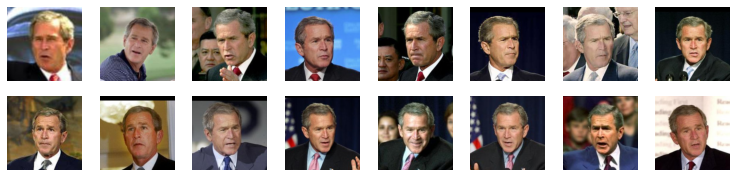

In [ ]:
# Create an empty array to store pokemon pics
# orig_img = np.empty((0, 40, 40, 3), dtype='float32')
orig_img = np.empty((0, 250, 250, 3), dtype='float32')
# Load all images and append into orig_img
# path = os.path.abspath("./Simple_Autoencoder.ipynb")
# path = re.sub('[a-zA-Z\s._]+$', '', path)
path = '/content/drive/My Drive/Assignments/George_W_Bush'  #path loaction on drive where all images are stored 
for pic in glob.glob(path+'/*.jpg'):
    img = mpimg.imread(pic)
    # remove alpha channel  %some alpha=0 but RGB is not equal to [1., 1., 1.]
    # img[img[:,:,3]==0] = np.ones((1,4))
    img = img[:,:,0:3]
    orig_img = np.append(orig_img, [img], axis=0)

# Use plt to show original images 
plotPoke(orig_img)

Showing the size of tensor in which images are loaded.

In [ ]:
orig_img.shape

(530, 250, 250, 3)

Reshaping Size to (64 X 64)

In [ ]:
rorig_img = tf.image.resize(orig_img, [64,64], antialias=True)

In [ ]:
def tensor_to_array(tensor1):
  return tensor1.numpy()

Converting Tensor to Array to easily work with Numpy Modules 

In [ ]:
rorig_img = tensor_to_array(rorig_img)

In [ ]:
rorig_img.shape

(530, 64, 64, 3)

70 % training samples

In [ ]:
train_len =round(len(rorig_img)*0.7)
train_len

371

In [ ]:
train_data = rorig_img[0:train_len]

In [ ]:
train_data.shape

(371, 64, 64, 3)

Showing Some Training Images

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


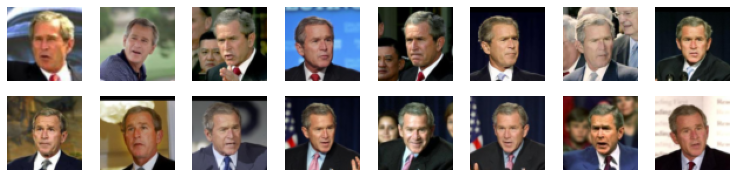

In [ ]:
plotPoke(train_data)

20 % Validation Samples

In [ ]:
val_len =round(len(orig_img)*0.2)
val_len

106

In [ ]:
val_data = rorig_img[train_len:train_len + val_len]
val_data.shape

(106, 64, 64, 3)

Visualizing Some Validation Images

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


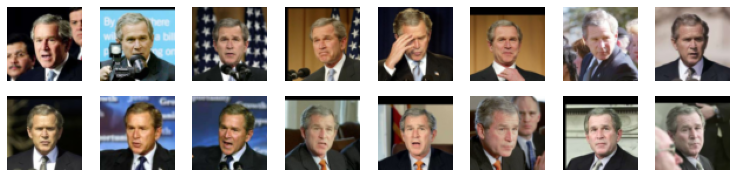

In [ ]:
plotPoke(val_data)

Rest 10 % is Testing Samples

In [ ]:
test_data = rorig_img[train_len + val_len:]
test_data.shape

(53, 64, 64, 3)

Visualizing Some Testing Images

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


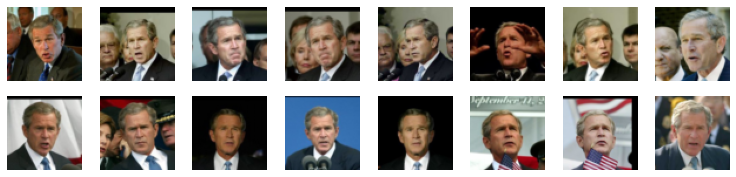

In [ ]:
plotPoke(test_data)

Normalize the data

We want the pixels values between 0 and 1 instead of between 0 and 255

In [ ]:
X_train = train_data.astype("float32")/255.
X_val = val_data.astype("float32")/255.
X_test = test_data.astype("float32")/255.
# X_train = tf.image.per_image_standardization(train_data)
# X_val = tf.image.per_image_standardization(val_data) 
print('X_train shape:', X_train.shape)
print(X_train.shape[0], 'train samples')
print(X_val.shape[0], 'validation samples')

X_train shape: (371, 64, 64, 3)
371 train samples
106 validation samples


Flatten the images for the Fully-Connected Networks

In [ ]:
X_train = X_train.reshape((len(X_train), np.prod(X_train.shape[1:])))
X_val = X_val.reshape((len(X_val), np.prod(X_val.shape[1:])))
X_test = X_test.reshape((len(X_test), np.prod(X_test.shape[1:])))

In [ ]:
X_train.shape

(371, 12288)

In [ ]:
len(X_train[1])

12288


**Create the network**


*Vanilla Autoencoder*

The first network is the most simple autoencoder. It has three layers : Input - encoded - decoded

In [ ]:
from keras import optimizers
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

In [ ]:
input_size = len(X_train[1]) #64*64*3
hidden_size = 1000
output_size = len(X_train[1]) #64*64*3

Change learning rate in below cell for different experiments

In [ ]:
x = Input(shape=(input_size,))
h = Dense(hidden_size, activation='relu')(x)
r = Dense(output_size, activation='sigmoid')(h)

autoencoder = Model(inputs=x, outputs=r)
autoencoder.compile(optimizer= optimizers.Adam(lr =  0.0001), loss='mse') #Change learning rate here Adam(lr = 0.0005)

Visulaizing Network Structure

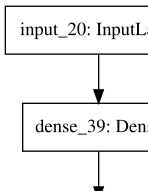

In [ ]:
from IPython.display import SVG
from keras.utils.vis_utils import model_to_dot

SVG(model_to_dot(autoencoder).create(prog='dot', format='svg'))

**Training**

Different Experiments were performed to optimize the network to reduce validation MSE loss. All code relating to different exeriments are commented in below cell except the one found to be better and appropriate than others.

In [ ]:
epochs = 1000
batch_size = 64
reduce_lr_loss = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=7, verbose=1, epsilon=1e-4, mode='min')
earlyStopping = EarlyStopping(monitor='val_loss', patience=10, verbose=0, mode='min')

#Exp1
history = autoencoder.fit(X_train, X_train, batch_size=batch_size, epochs=epochs, verbose=1, validation_data=(X_val, X_val),callbacks=[earlyStopping])

# #Exp2
# history = autoencoder.fit(X_train, X_train, batch_size=batch_size, epochs=epochs, validation_data=(X_val, X_val),callbacks=[earlyStopping, reduce_lr_loss])

/usr/local/lib/python3.6/dist-packages/keras/callbacks/callbacks.py:998: UserWarning: `epsilon` argument is deprecated and will be removed, use `min_delta` instead.
  warnings.warn('`epsilon` argument is deprecated and '


Train on 371 samples, validate on 106 samples
Epoch 1/1000
371/371 [==============================] - 0s 437us/step - loss: 0.0858 - val_loss: 0.0830
Epoch 2/1000
371/371 [==============================] - 0s 221us/step - loss: 0.0799 - val_loss: 0.0732
Epoch 3/1000
371/371 [==============================] - 0s 228us/step - loss: 0.0707 - val_loss: 0.0632
Epoch 4/1000
371/371 [==============================] - 0s 221us/step - loss: 0.0619 - val_loss: 0.0562
Epoch 5/1000
371/371 [==============================] - 0s 220us/step - loss: 0.0558 - val_loss: 0.0519
Epoch 6/1000
371/371 [==============================] - 0s 221us/step - loss: 0.0521 - val_loss: 0.0493
Epoch 7/1000
371/371 [==============================] - 0s 228us/step - loss: 0.0496 - val_loss: 0.0475
Epoch 8/1000
371/371 [==============================] - 0s 220us/step - loss: 0.0477 - val_loss: 0.0459
Epoch 9/1000
371/371 [==============================] - 0s 232us/step - loss: 0.0460 - val_loss: 0.0446
Epoch 10/1000
371/

Visualizing the Encoded Images

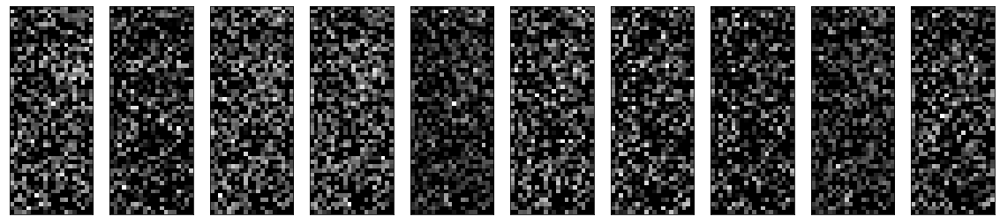

In [ ]:
conv_encoder = Model(x, h)
encoded_imgs = conv_encoder.predict(X_val)

n = 10
plt.figure(figsize=(20, 8))
for i in range(n):
    ax = plt.subplot(1, n, i+1)
    plt.imshow(encoded_imgs[i].reshape(20, 50).T)
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

Predict on the validation set

In [ ]:
decoded_imgs = autoencoder.predict(X_val)

Visualizing Original (First Row) and Reconstructed Validation Images (Second Row)

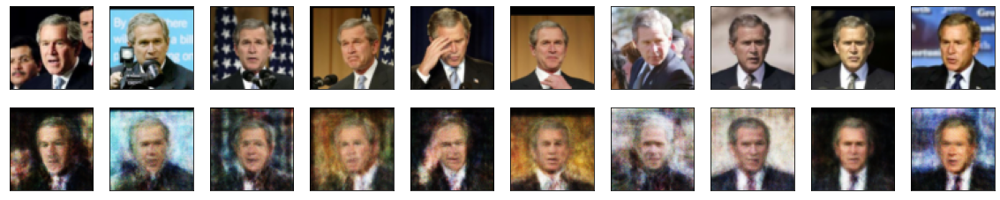

In [ ]:
n = 10
plt.figure(figsize=(20, 6))
for i in range(n):
    # display original
    ax = plt.subplot(3, n, i+1)
    plt.imshow(X_val[i].reshape(64, 64, 3))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    
    # display reconstruction
    ax = plt.subplot(3, n, i+n+1)
    plt.imshow(decoded_imgs[i].reshape(64, 64, 3))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    
plt.show()

Predict on the test set

In [ ]:
Testdecoded_imgs = autoencoder.predict(X_test)

Loss Calculation on Testing Samples

In [ ]:
from sklearn.metrics import mean_squared_error
loss = mean_squared_error(X_test, Testdecoded_imgs)
print(loss)

0.014048886


Visualizing Original (First Row) and Reconstructed Testing Images (Second Row)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


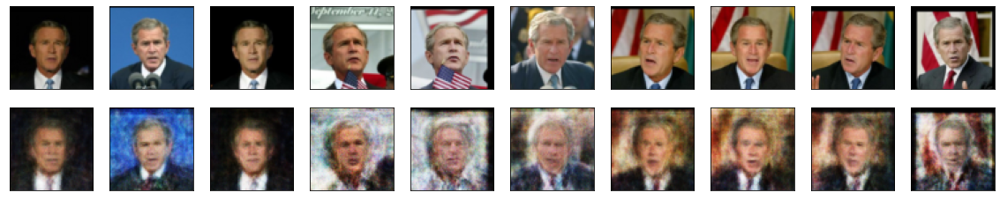

In [ ]:
n = 10
plt.figure(figsize=(20, 6))
for i in range(n):
    # display original
    ax = plt.subplot(3, n, i+1)
    plt.imshow(X_test[i+10].reshape(64, 64, 3))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    
    # display reconstruction
    ax = plt.subplot(3, n, i+n+1)
    plt.imshow(Testdecoded_imgs[i+10].reshape(64, 64, 3))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    
plt.show()

Plot of Losses

dict_keys(['val_loss', 'loss'])


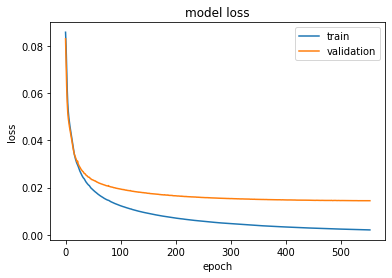

In [ ]:
print(history.history.keys())

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()

## PCA

In [ ]:
import scipy.misc
import skimage
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

print("Image Matrix size is {}".format(rorig_img.shape))

Image Matrix size is (530, 64, 64, 3)


In [ ]:
img_r = np.reshape(rorig_img, (530, 64*64*3)) 
print(img_r.shape)

(530, 12288)


**PCA on complemete Image Matrix (Matrix size 530X12288)(All 530 samples)** 

In [ ]:
"""
import warnings
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    
import warnings
warnings.filterwarnings('once')

import warnings
warnings.filterwarnings("ignore", message="Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).")

warnings.filterwarnings("ignore", module="matplotlib")

"""

'\nimport warnings\nwith warnings.catch_warnings():\n    warnings.simplefilter("ignore")\n    \nimport warnings\nwarnings.filterwarnings(\'once\')\n\nimport warnings\nwarnings.filterwarnings("ignore", message="Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).")\n\nwarnings.filterwarnings("ignore", module="matplotlib")\n\n'

In [ ]:
#Loss Calculation
from sklearn.metrics import mean_squared_error
#loss = mean_squared_error(ytrue, ypred)

Visualizing Original (First Row) and Reconstructed Images (Second Row) with different number of Top Eigen Vectors

Corresponding MSE loss is also mentioned

componenets (i.e. numbers of top eigen vectors)- 10 and The MSE loss = 0.02634049393236637


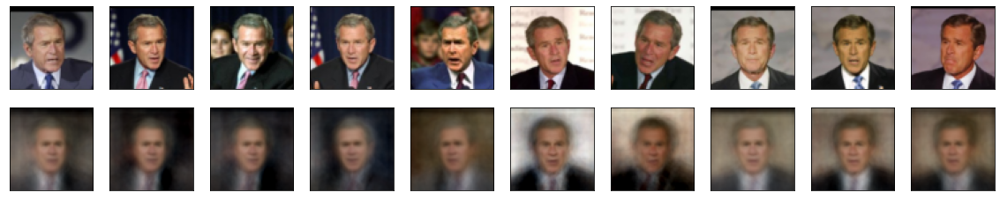

componenets (i.e. numbers of top eigen vectors)- 20 and The MSE loss = 0.01938091218471527


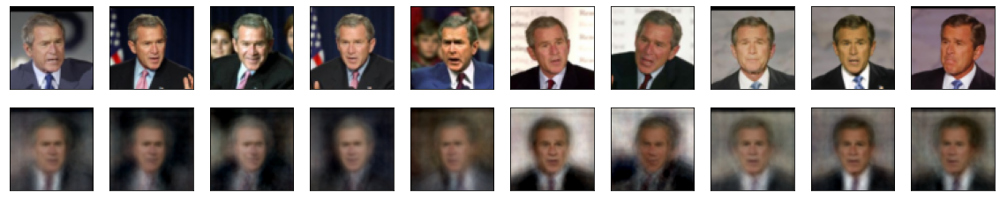

componenets (i.e. numbers of top eigen vectors)- 30 and The MSE loss = 0.015560183674097061


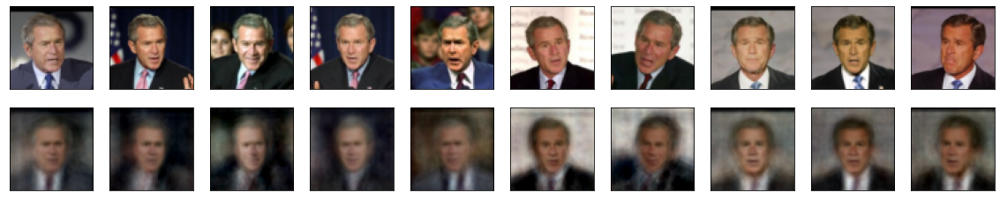

componenets (i.e. numbers of top eigen vectors)- 40 and The MSE loss = 0.013092751614749432


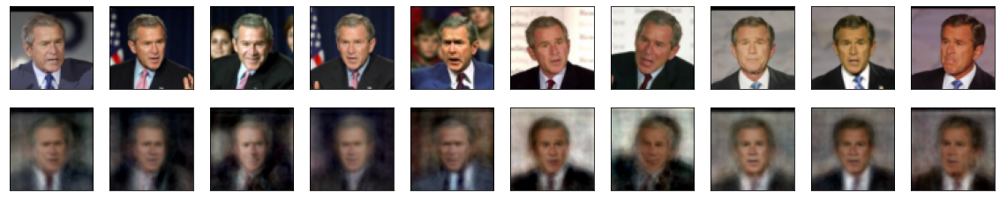

componenets (i.e. numbers of top eigen vectors)- 50 and The MSE loss = 0.011237170547246933


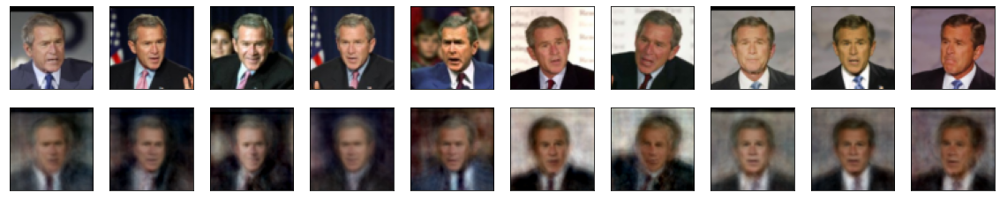

componenets (i.e. numbers of top eigen vectors)- 60 and The MSE loss = 0.009841407649219036


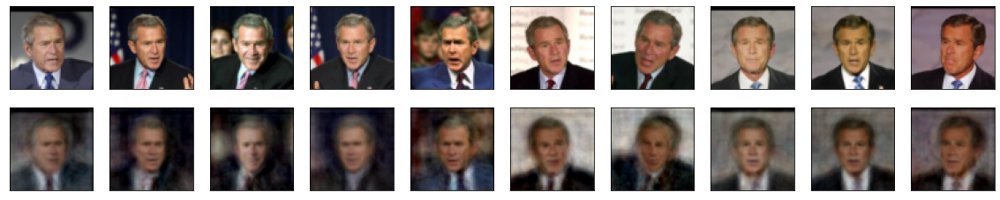

componenets (i.e. numbers of top eigen vectors)- 70 and The MSE loss = 0.00874093547463417


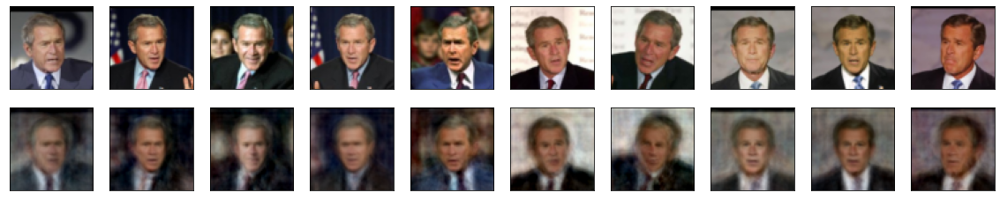

In [ ]:
for j in range(10,80,10):
    faces_pca = PCA(n_components=j)
    ipca = faces_pca.fit(img_r) 
    img_c = ipca.transform(img_r) 
    temp = ipca.inverse_transform(img_c) 
    temp1 = np.reshape(temp, (530, 64, 64, 3))
    # print(np.amax(temp1))
    # print(np.amin(temp1))
    temp1 = temp1/np.amax(temp1)
    # temp1 = np.array(temp1,np.int32)
    temp1 = np.clip(temp1, 0, 1)
    loss = mean_squared_error(img_r/255, temp/255)
    print("componenets (i.e. numbers of top eigen vectors)- {}".format(j) + " and The MSE loss = {}".format(loss))

    n = 10
    plt.figure(figsize=(20, 6))
    for i in range(n):
        # display original
        ax = plt.subplot(3, n, i+1)
        plt.imshow((img_r[i+10].reshape(64, 64, 3)).astype(np.uint8))
        plt.gray()
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

        
        # display reconstruction
        ax = plt.subplot(3, n, i+n+1)
        plt.imshow((temp1[i+10].reshape(64, 64, 3)))
    
        plt.gray()
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

        
        
    plt.show()
    

In [ ]:
np.amax(img_r)

255.00006

In [ ]:
np.amax(temp)

332.14264

**PCA on Training Images Matrix (Matrix size 371X12288)(All 371 samples)**

In [ ]:
X_train.shape

(371, 12288)

Visualizing Original (First Row) and Reconstructed Training Images (Second Row) with different number of Top Eigen Vectors

Corresponding MSE loss is also mentioned

componenets (i.e. numbers of top eigen vectors)- 10 and The MSE loss = 0.026283780112862587


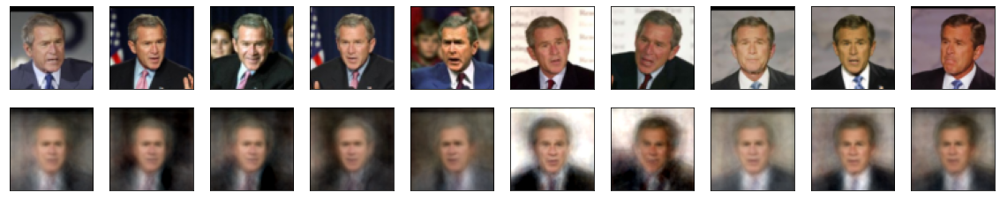

componenets (i.e. numbers of top eigen vectors)- 20 and The MSE loss = 0.01911679469048977


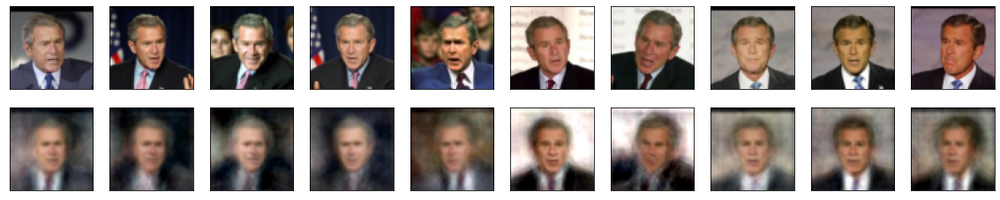

componenets (i.e. numbers of top eigen vectors)- 30 and The MSE loss = 0.015131671912968159


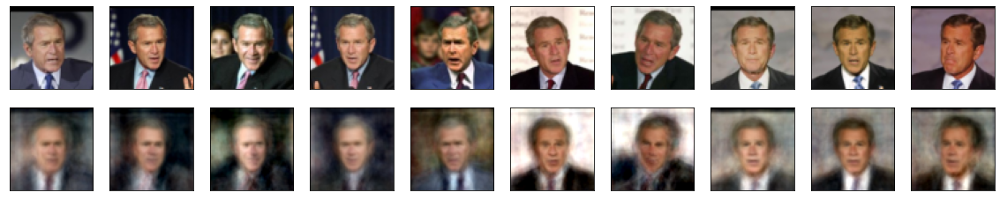

componenets (i.e. numbers of top eigen vectors)- 40 and The MSE loss = 0.012546875514090061


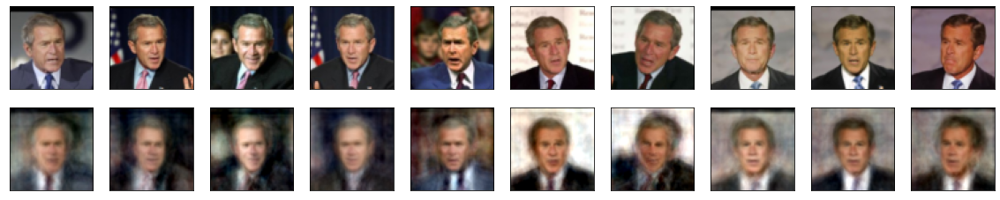

componenets (i.e. numbers of top eigen vectors)- 50 and The MSE loss = 0.010618877597153187


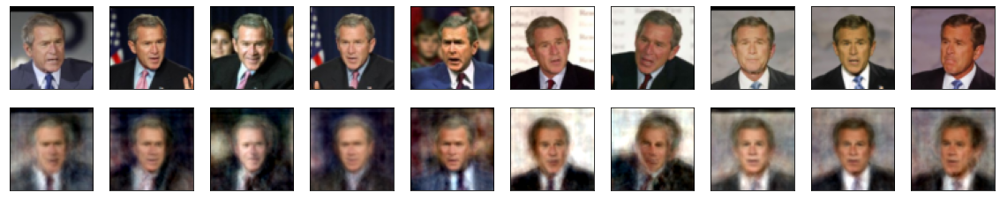

componenets (i.e. numbers of top eigen vectors)- 60 and The MSE loss = 0.0091477045789361


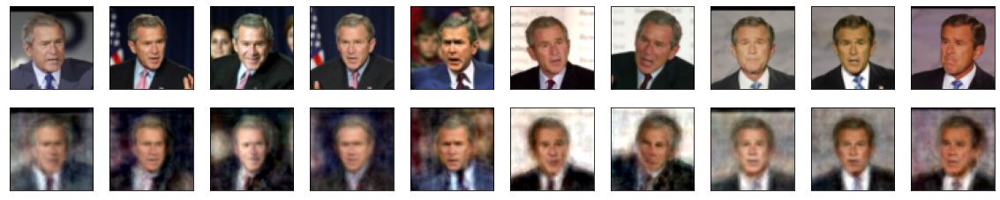

componenets (i.e. numbers of top eigen vectors)- 70 and The MSE loss = 0.007974836975336075


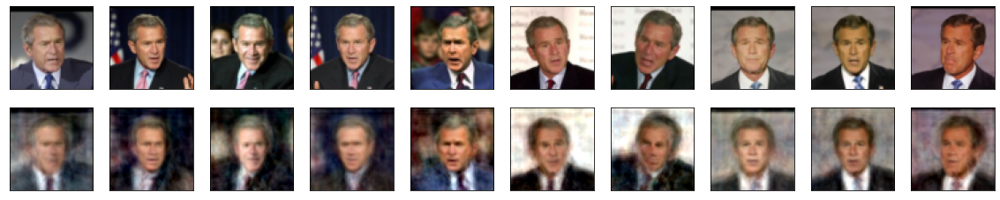

componenets (i.e. numbers of top eigen vectors)- 80 and The MSE loss = 0.007004575338214636


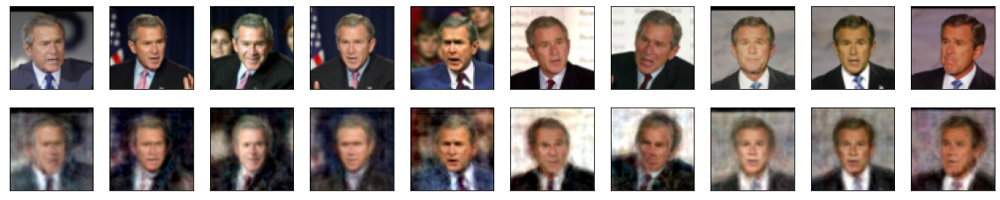

componenets (i.e. numbers of top eigen vectors)- 90 and The MSE loss = 0.006198249291628599


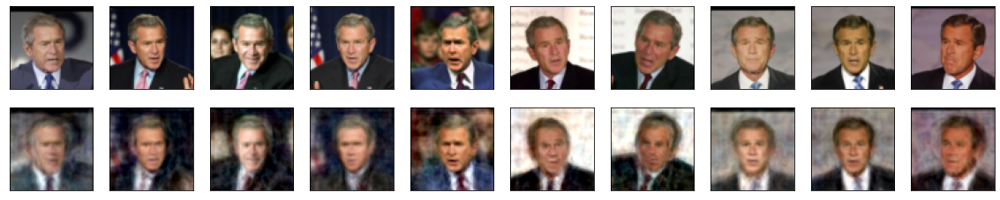

componenets (i.e. numbers of top eigen vectors)- 100 and The MSE loss = 0.005511536728590727


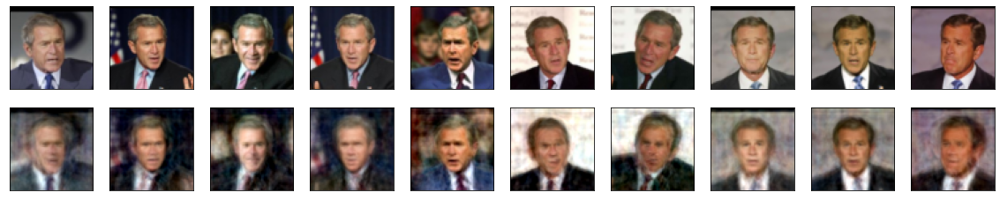

componenets (i.e. numbers of top eigen vectors)- 110 and The MSE loss = 0.0049100168980658054


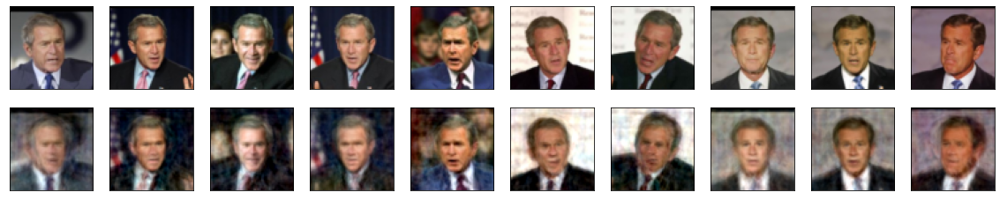

componenets (i.e. numbers of top eigen vectors)- 120 and The MSE loss = 0.004383470397442579


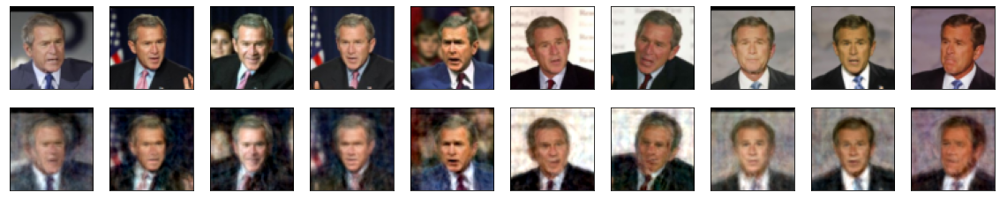

componenets (i.e. numbers of top eigen vectors)- 130 and The MSE loss = 0.003917072433978319


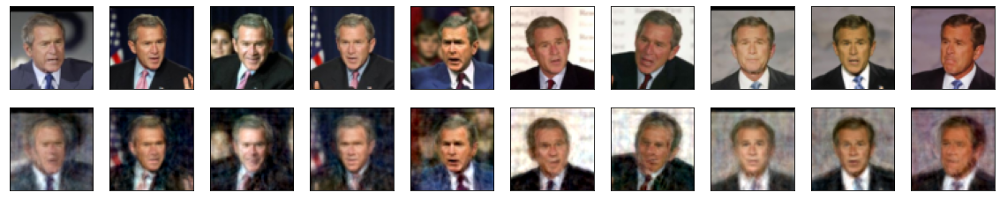

componenets (i.e. numbers of top eigen vectors)- 140 and The MSE loss = 0.0034956291783601046


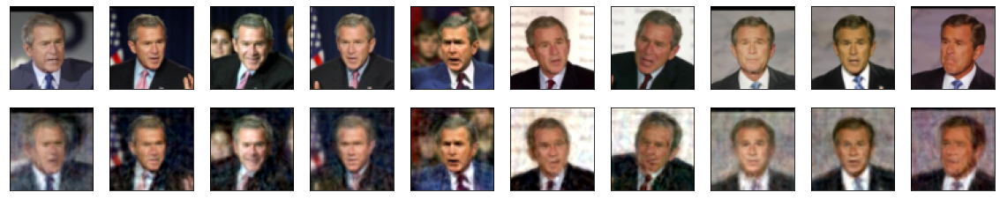

componenets (i.e. numbers of top eigen vectors)- 150 and The MSE loss = 0.003138175932690501


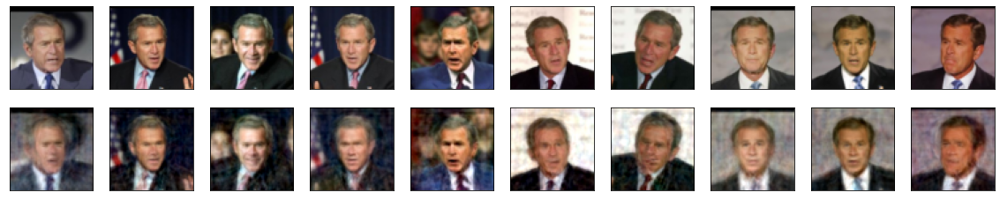

componenets (i.e. numbers of top eigen vectors)- 160 and The MSE loss = 0.002809329656884074


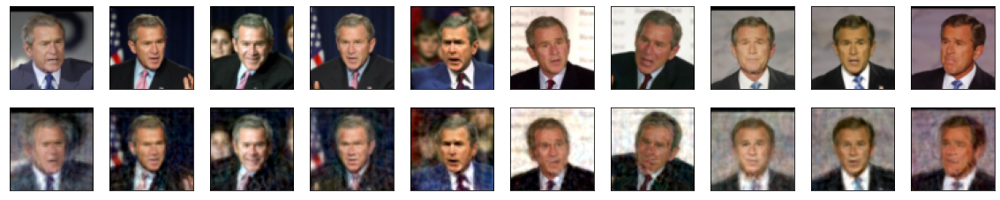

componenets (i.e. numbers of top eigen vectors)- 170 and The MSE loss = 0.0025154512841254473


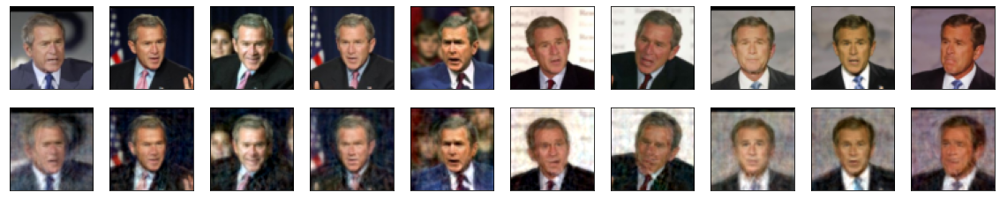

componenets (i.e. numbers of top eigen vectors)- 180 and The MSE loss = 0.0022454194258898497


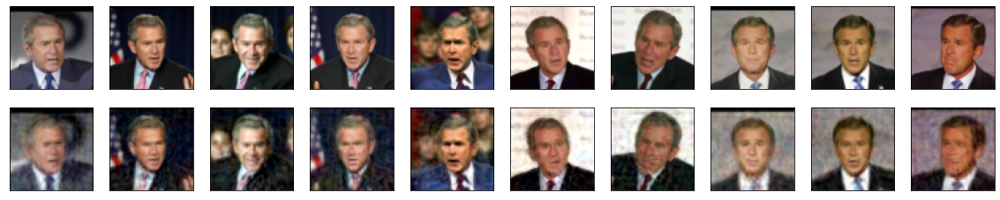

componenets (i.e. numbers of top eigen vectors)- 190 and The MSE loss = 0.002005206188187003


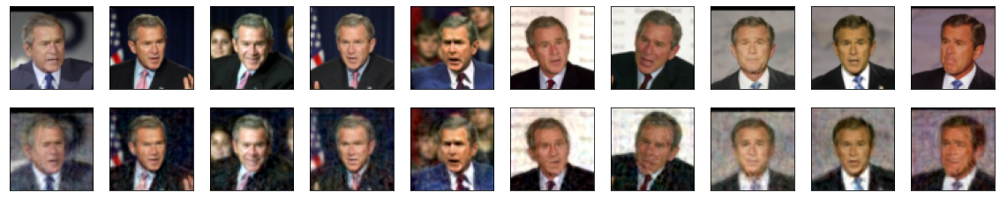

In [ ]:
for j in range(10,200,10):
    faces_pca = PCA(n_components=j)
    ipca = faces_pca.fit(X_train) 
    img_c = ipca.transform(X_train) 
    temp = ipca.inverse_transform(img_c) 
    
    temp1 = np.reshape(temp, (371, 64, 64, 3))
    # print(np.amax(temp1))
    X_train = np.clip(X_train, 0, 1)
    temp1 = np.clip(temp1, 0, 1)  #clipping the data to valid range (0,1) for imshow
    # temp1 = temp1/ np.amax(temp1)
    # print(np.amax(temp1))
    # print(np.amin(temp1))
    # temp1 = temp1/255    
    # temp1 = np.array(temp1,np.int32)
    loss = mean_squared_error(X_train, temp)
    print("componenets (i.e. numbers of top eigen vectors)- {}".format(j) + " and The MSE loss = {}".format(loss))
    n = 10
    plt.figure(figsize=(20, 6))
    for i in range(n):
        # display original
        ax = plt.subplot(3, n, i+1)
        plt.imshow((X_train[i+10].reshape(64, 64, 3)))
        plt.gray()
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

        
        # display reconstruction
        ax = plt.subplot(3, n, i+n+1)
        # plt.imshow((temp1[i+10].reshape(64, 64, 3)), vmin = np.amin(temp1) , vmax = np.amax(temp1))
        vmin = np.amin(temp1[i+10])
        vmax = np.amax(temp1[i+10])
        plt.imshow((temp1[i+10].reshape(64, 64, 3)))
    
        plt.gray()
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

        
        
    plt.show()
    

**PCA on Validation Images Matrix (Matrix size 371X12288)(106 Validation Samples)**

In [ ]:
len(X_val)

106

Visualizing Original (First Row) and Reconstructed Validation Images (Second Row) with different number of Top Eigen Vectors

Corresponding MSE loss is also mentioned

componenets (i.e. numbers of top eigen vectors)- 10 and The MSE loss = 0.02235233783721924


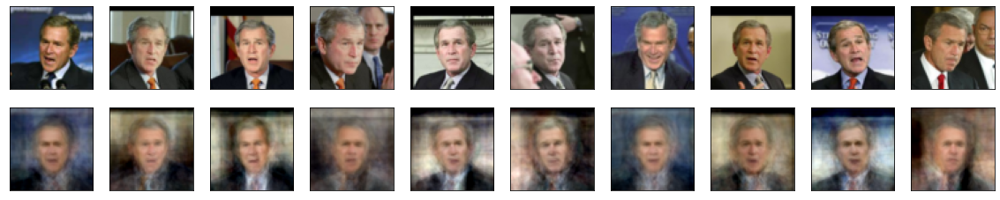

componenets (i.e. numbers of top eigen vectors)- 20 and The MSE loss = 0.014699921011924744


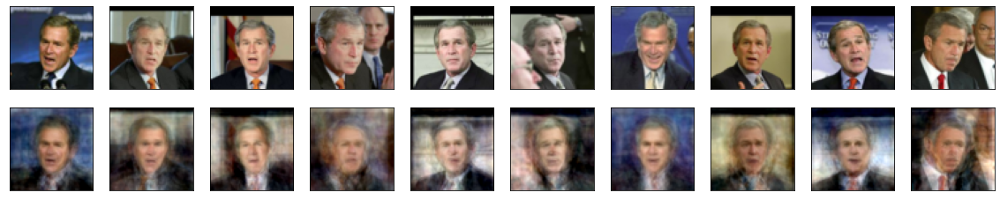

componenets (i.e. numbers of top eigen vectors)- 30 and The MSE loss = 0.01044747605919838


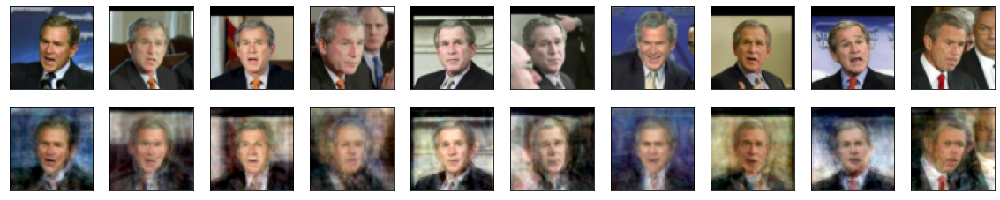

componenets (i.e. numbers of top eigen vectors)- 40 and The MSE loss = 0.007470931392163038


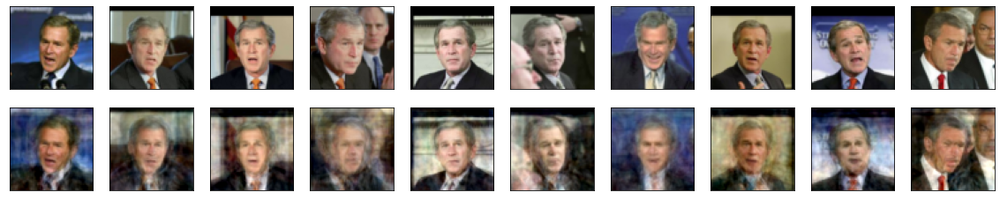

componenets (i.e. numbers of top eigen vectors)- 50 and The MSE loss = 0.005298365373164415


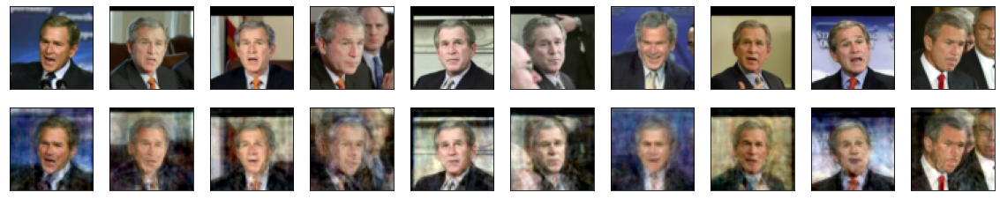

componenets (i.e. numbers of top eigen vectors)- 60 and The MSE loss = 0.0036741711664944887


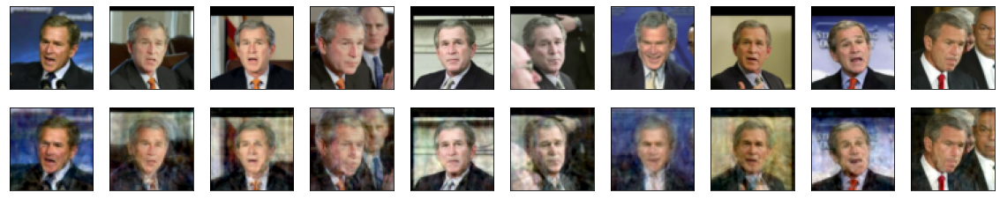

componenets (i.e. numbers of top eigen vectors)- 70 and The MSE loss = 0.0024463150184601545


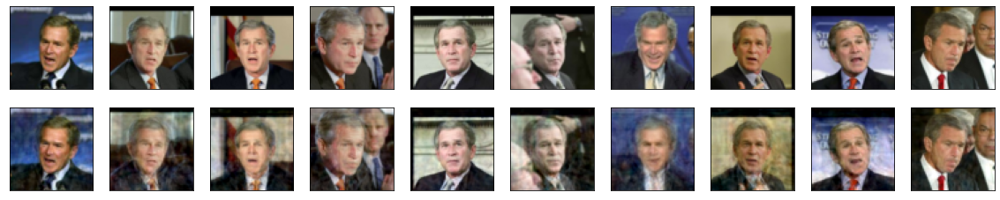

componenets (i.e. numbers of top eigen vectors)- 80 and The MSE loss = 0.00149111682549119


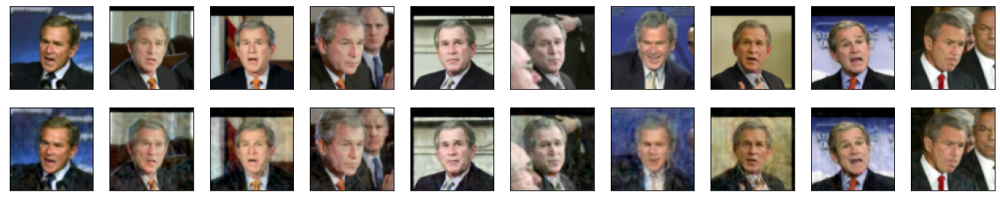

componenets (i.e. numbers of top eigen vectors)- 90 and The MSE loss = 0.000746418081689626


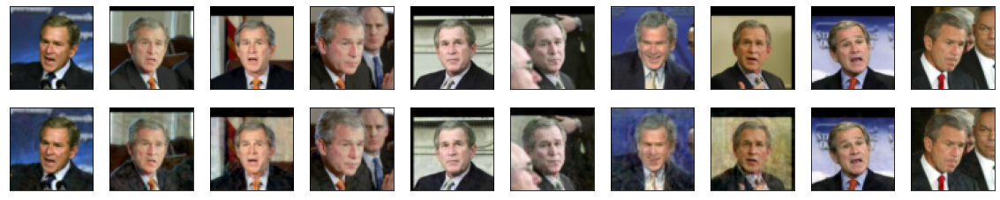

In [ ]:
for j in range(10,100,10):
    faces_pca = PCA(n_components=j)
    ipca = faces_pca.fit(X_val) 
    img_c = ipca.transform(X_val) 
    temp = ipca.inverse_transform(img_c) 
    
    temp1 = np.reshape(temp, (len(X_val), 64, 64, 3))
    # print(np.amax(temp1))
    temp1 = np.clip(temp1, 0, 1)  #clipping the data to valid range (0,1) for imshow
    X_val = np.clip(X_val, 0, 1)
    # temp1 = temp1/ np.amax(temp1)
    # print(np.amax(temp1))
    # print(np.amin(temp1))
    # temp1 = temp1/255    
    # temp1 = np.array(temp1,np.int32)
    loss = mean_squared_error(X_val, temp)
    print("componenets (i.e. numbers of top eigen vectors)- {}".format(j) + " and The MSE loss = {}".format(loss))

    n = 10
    plt.figure(figsize=(20, 6))
    for i in range(n):
        # display original
        ax = plt.subplot(3, n, i+1)
        # plt.imshow((img_r[i+10].reshape(64, 64, 3)).astype(np.uint8))
        plt.imshow((X_val[i+10].reshape(64, 64, 3)))
        plt.gray()
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

        
        # display reconstruction
        ax = plt.subplot(3, n, i+n+1)
        # plt.imshow((temp1[i+10].reshape(64, 64, 3)), vmin = np.amin(temp1) , vmax = np.amax(temp1))
        vmin = np.amin(temp1[i+10])
        vmax = np.amax(temp1[i+10])
        plt.imshow((temp1[i+10].reshape(64, 64, 3)))
    
        plt.gray()
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

        
        
    plt.show()
    

**PCA on Test Images Matrix (Matrix size 53X12288)( 53 Test samples)**





Visualizing Original (First Row) and Reconstructed Testing Images (Second Row) with different number of Top Eigen Vectors

Corresponding MSE loss is also mentioned

componenets (i.e. numbers of top eigen vectors)- 10 and The MSE loss = 0.019226176664233208


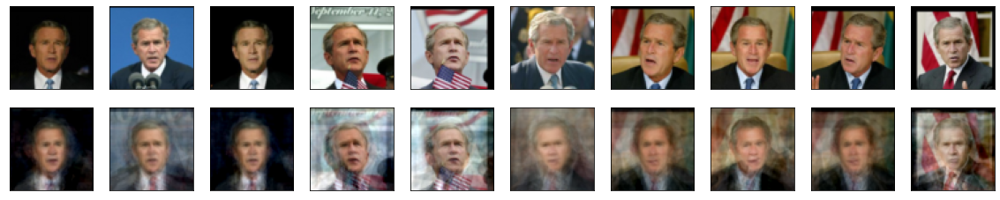

componenets (i.e. numbers of top eigen vectors)- 15 and The MSE loss = 0.01369630079716444


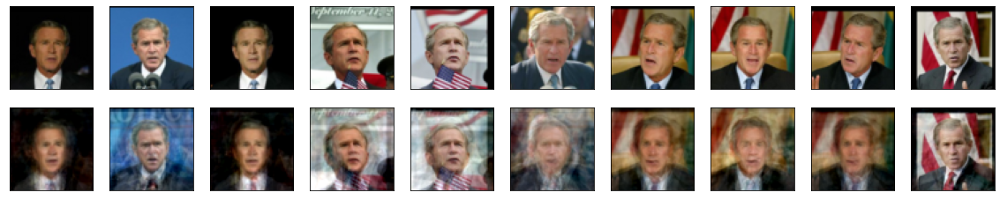

componenets (i.e. numbers of top eigen vectors)- 20 and The MSE loss = 0.009863987565040588


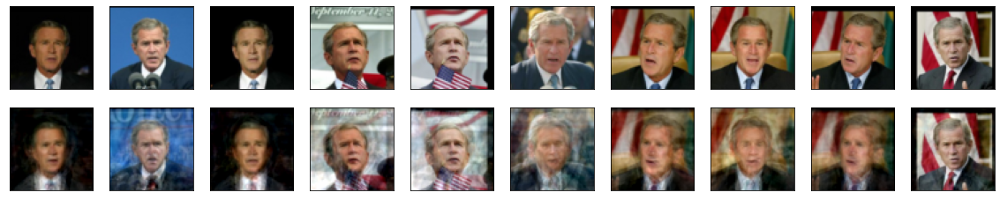

componenets (i.e. numbers of top eigen vectors)- 25 and The MSE loss = 0.007188815623521805


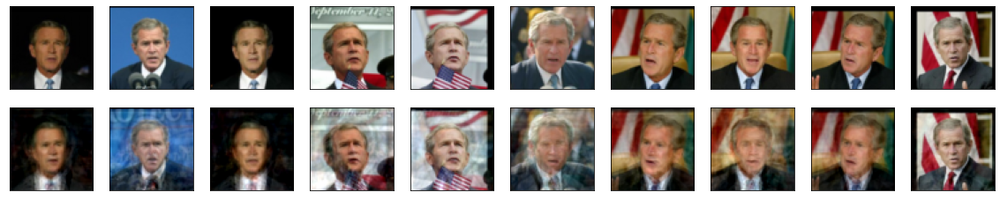

componenets (i.e. numbers of top eigen vectors)- 30 and The MSE loss = 0.005049459636211395


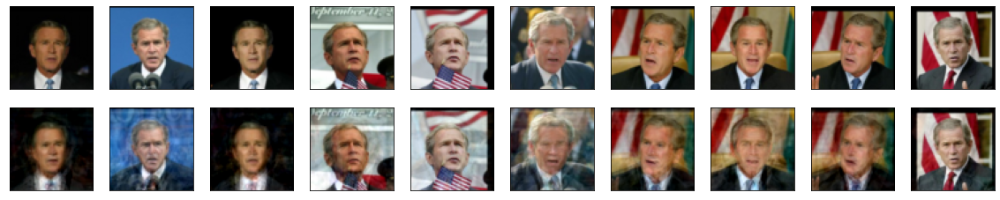

componenets (i.e. numbers of top eigen vectors)- 35 and The MSE loss = 0.003319770097732544


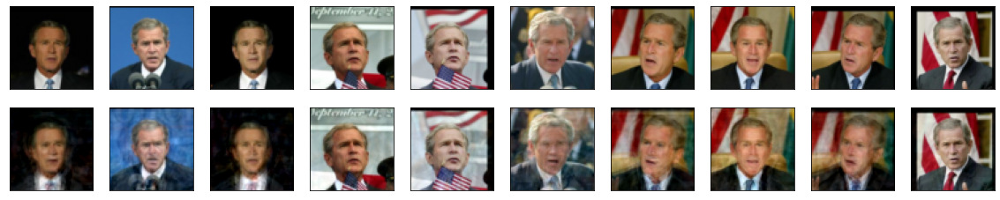

componenets (i.e. numbers of top eigen vectors)- 40 and The MSE loss = 0.002009427407756448


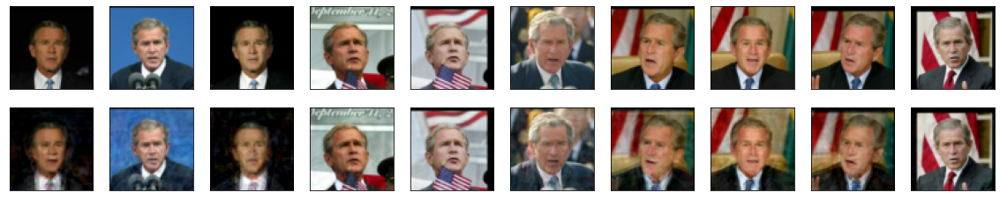

componenets (i.e. numbers of top eigen vectors)- 45 and The MSE loss = 0.0009812918724492192


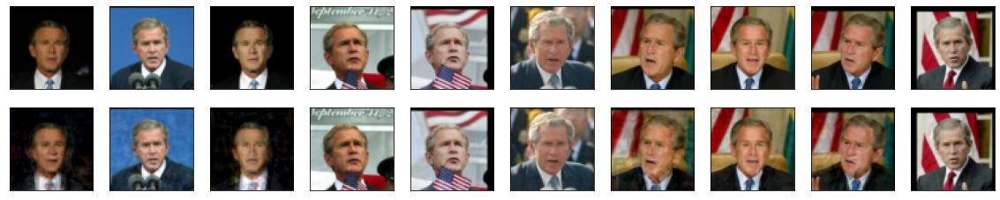

In [ ]:
for j in range(10,50,5):
    faces_pca = PCA(n_components=j)
    ipca = faces_pca.fit(X_test) 
    img_c = ipca.transform(X_test) 
    temp = ipca.inverse_transform(img_c) 
    
    temp1 = np.reshape(temp, (len(X_test), 64, 64, 3))
    # print(np.amax(temp1))
    temp1 = np.clip(temp1, 0, 1)  #clipping the data to valid range (0,1) for imshow
    X_test = np.clip(X_test, 0, 1)
    # temp1 = temp1/ np.amax(temp1)
    # print(np.amax(temp1))
    # print(np.amin(temp1))
    # temp1 = temp1/255    
    # temp1 = np.array(temp1,np.int32)
    loss = mean_squared_error(X_test, temp)
    print("componenets (i.e. numbers of top eigen vectors)- {}".format(j) + " and The MSE loss = {}".format(loss))
    
    n = 10
    plt.figure(figsize=(20, 6))
    for i in range(n):
        # display original
        ax = plt.subplot(3, n, i+1)
        # plt.imshow((img_r[i+10].reshape(64, 64, 3)).astype(np.uint8))
        plt.imshow((X_test[i+10].reshape(64, 64, 3)))
        plt.gray()
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

        
        # display reconstruction
        ax = plt.subplot(3, n, i+n+1)
        # plt.imshow((temp1[i+10].reshape(64, 64, 3)), vmin = np.amin(temp1) , vmax = np.amax(temp1))
        vmin = np.amin(temp1[i+10])
        vmax = np.amax(temp1[i+10])
        plt.imshow((temp1[i+10].reshape(64, 64, 3)))
    
        plt.gray()
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

        
        
    plt.show()
    